<a href="https://colab.research.google.com/github/konrado10/NaukaGIT/blob/master/Zad157.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Artificial Inteligence

## Document Scanner - Skaner dokumentów

### Zad 1

In [1]:
import cv2
from google.colab.patches import cv2_imshow
import imutils

print(cv2.__version__)

4.1.2


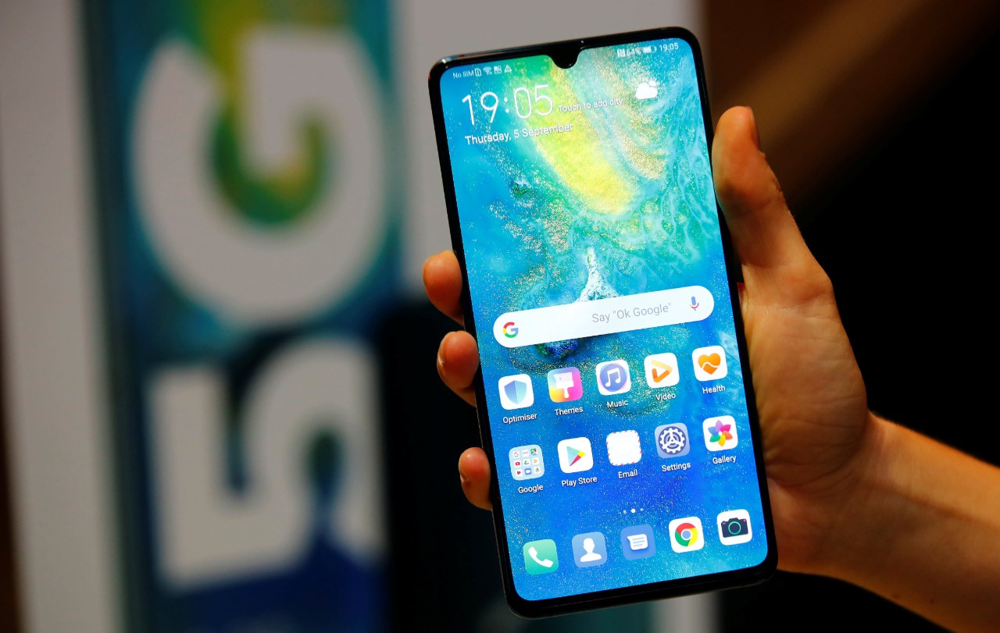

In [2]:
image = cv2.imread('phone.jpg')
imutils.resize(image=image, height=400)
cv2_imshow(image)

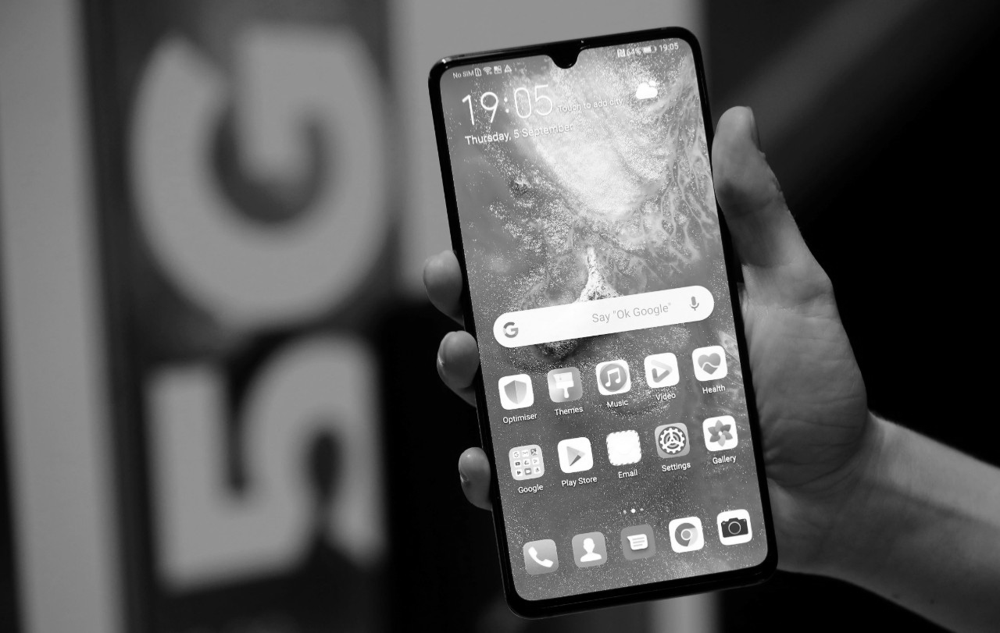

In [5]:
gray_image = cv2.cvtColor(src=image, code=cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

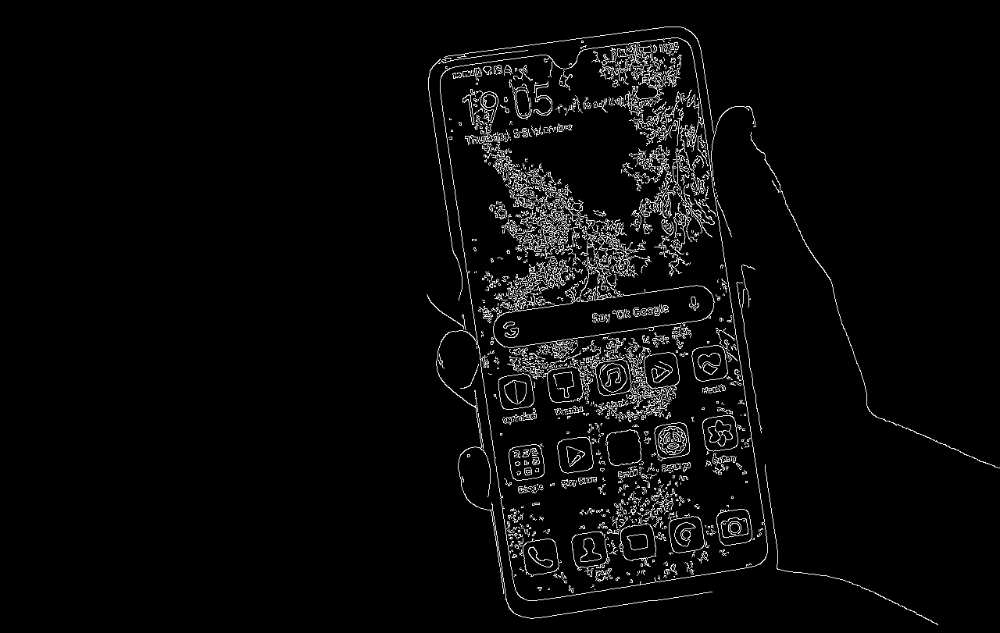

In [6]:
edges1 = cv2.Canny(image=gray_image, threshold1=70, threshold2=200)
cv2_imshow(edges1)

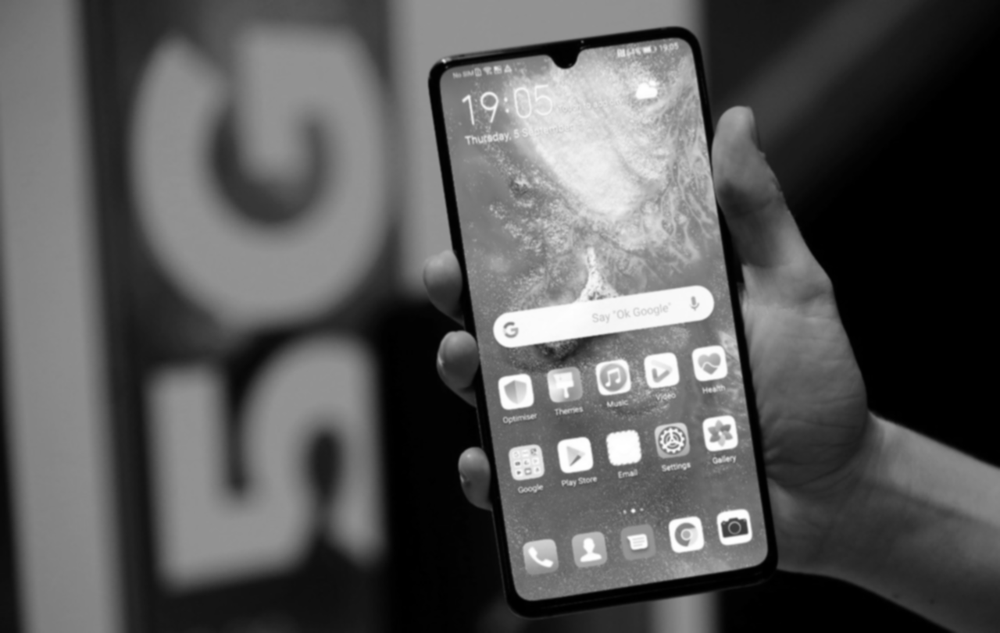

In [7]:
gray_image = cv2.GaussianBlur(src=gray_image, ksize=(5,5), sigmaX=0)
cv2_imshow(gray_image)

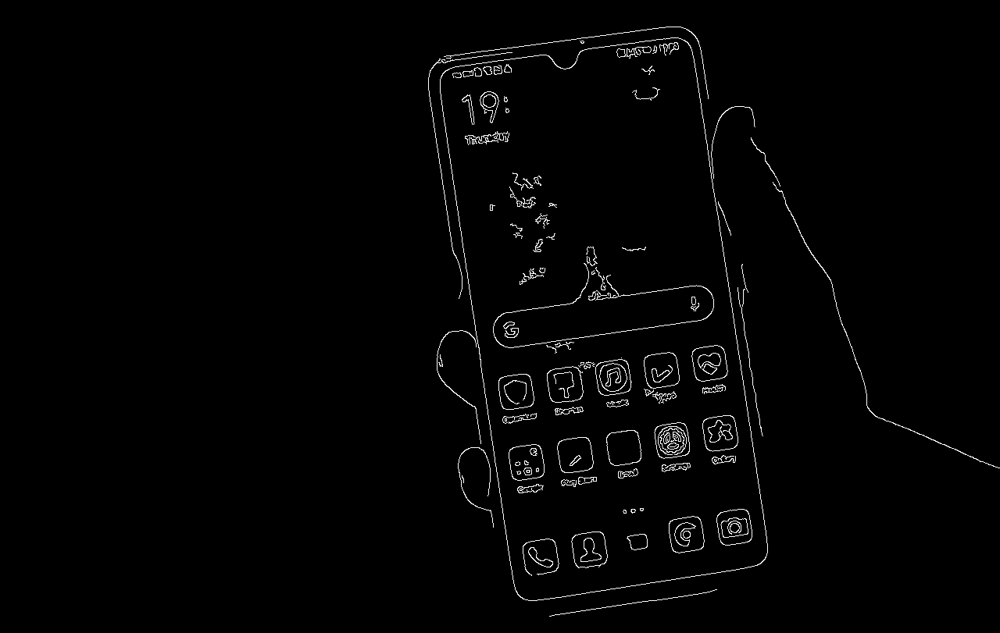

In [8]:
edges = cv2.Canny(image=gray_image, threshold1=70, threshold2=200)
cv2_imshow(edges)

In [11]:
contours = cv2.findContours(image=edges.copy(),
                            mode=cv2.RETR_LIST,
                            method=cv2.CHAIN_APPROX_SIMPLE)

contours = imutils.grab_contours(contours)
contours = sorted(contours, key = cv2.contourArea, reverse=True)[:10]

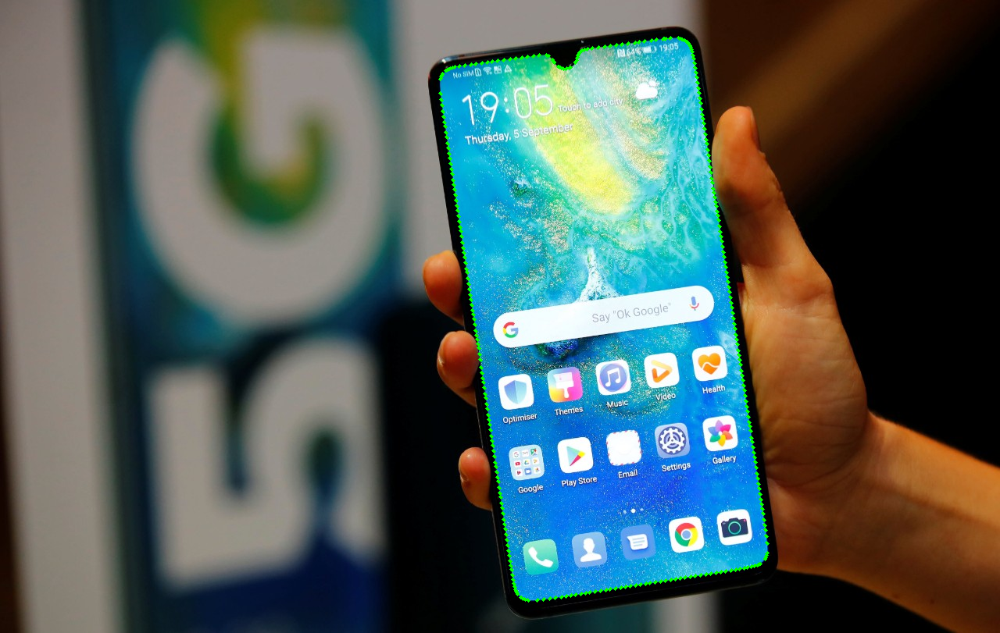

In [12]:
cnt1 = cv2.drawContours(image=image.copy(), contours=contours[0], contourIdx=-1, color=(0,255,5), thickness=3)

cv2_imshow(cnt1)

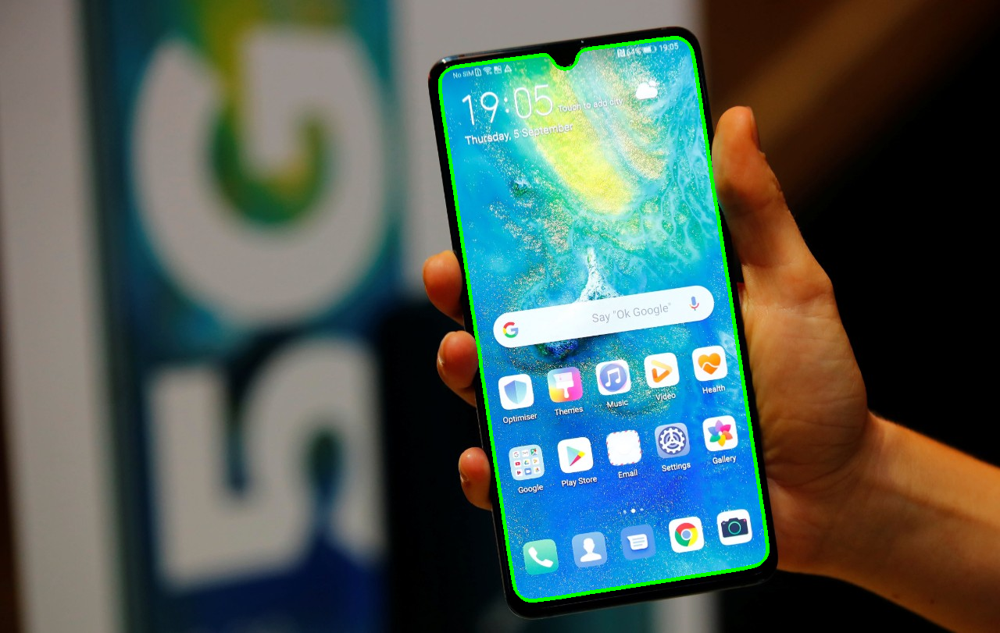

In [14]:
cnt2 = cv2.drawContours(image=image.copy(), contours=[contours[1]], contourIdx=-1, color=(0,255,5), thickness=3)

cv2_imshow(cnt2)

In [15]:
screen_contour = None

for contour in contours:
    perimeter = cv2.arcLength(curve=contour, closed=True)
    approx = cv2.approxPolyDP(curve=contour, epsilon=0.015*perimeter, closed=True)

    if len(approx) == 4:
        screen_contour = approx
        break

In [16]:
screen_contour

array([[[868,  48]],

       [[563, 101]],

       [[672, 768]],

       [[982, 708]]], dtype=int32)

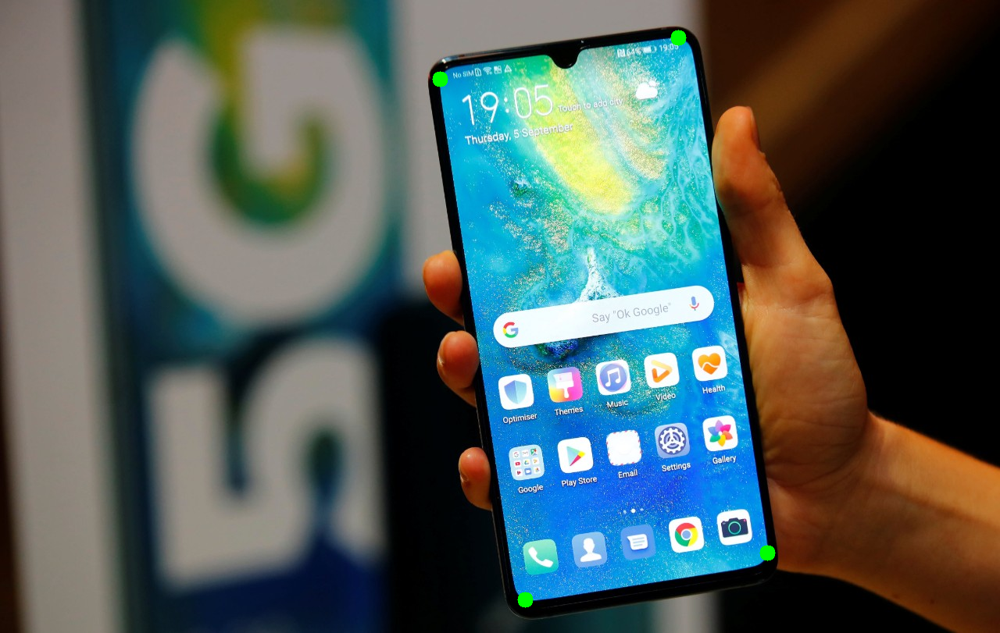

In [19]:
vertices = cv2.drawContours(image=image.copy(), contours=screen_contour, contourIdx=-1, color=(0,255,0), thickness=20)
cv2_imshow(vertices)

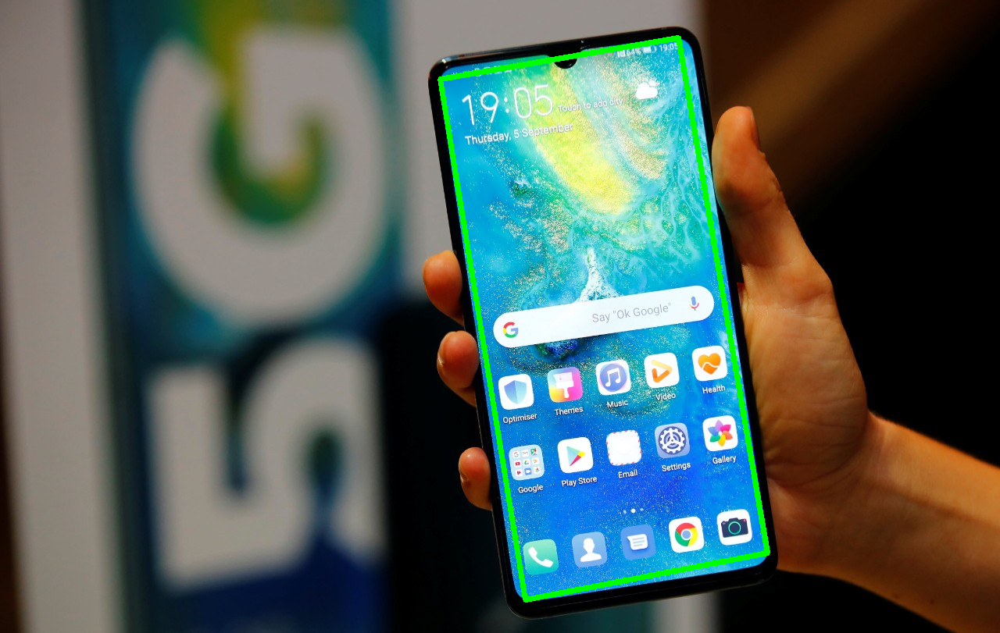

In [20]:
screen_contour = cv2.drawContours(image=image.copy(), contours=[screen_contour], contourIdx=-1, color=(0,255,0), thickness=5)
cv2_imshow(screen_contour)

### Zad 2

In [58]:
from google.colab.patches import cv2_imshow
from skimage.filters import threshold_local
import numpy as np
from numpy.linalg import norm
import imutils
import cv2
cv2.__version__

'4.1.2'

In [59]:
image = cv2.imread('paragon_1.jpg')
image.shape

(600, 450, 3)

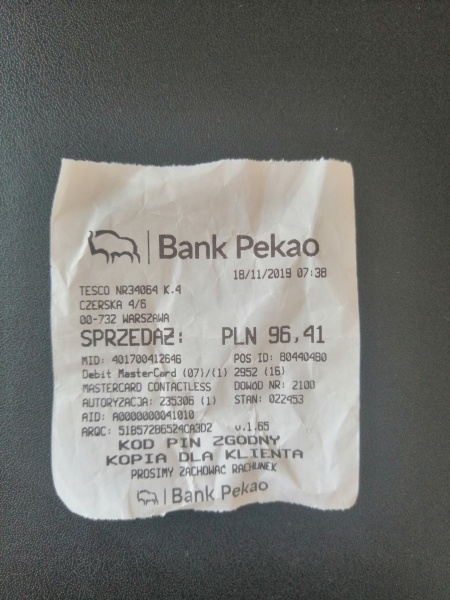

In [60]:
cv2_imshow(image)

In [61]:
original_image = image.copy()
ratio = image.shape[0]/500

image = imutils.resize(image, height=500)
image.shape

(500, 375, 3)

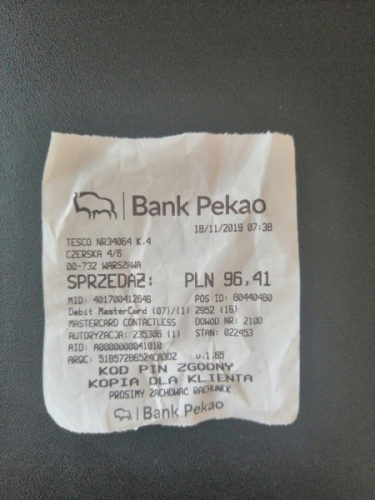

In [62]:
cv2_imshow(image)

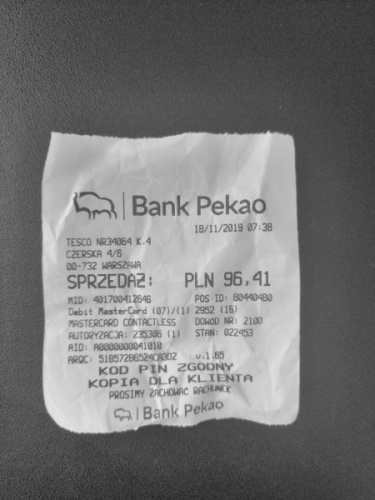

In [63]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

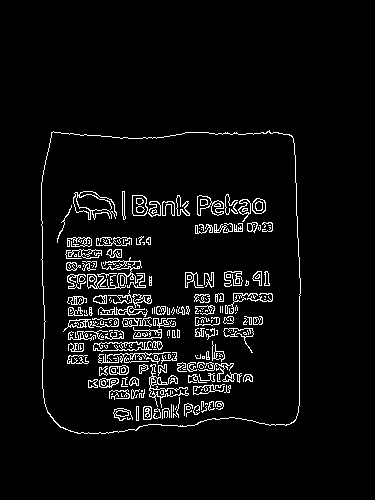

In [64]:
edges = cv2.Canny(image=gray_image, threshold1=75, threshold2=200)
cv2_imshow(edges)

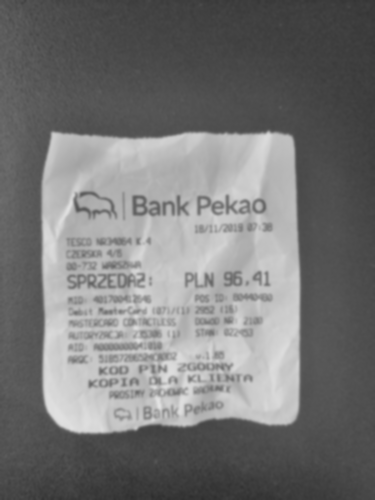

In [65]:
gray_image = cv2.GaussianBlur(src=gray_image, ksize=(5,5), sigmaX = 0)
cv2_imshow(gray_image)

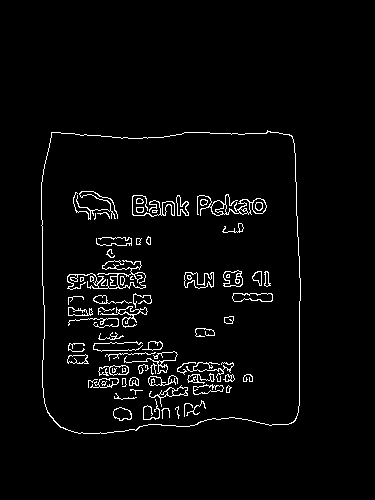

In [66]:
edges = cv2.Canny(image=gray_image, threshold1=75, threshold2=200)
cv2_imshow(edges)

In [67]:
contours = cv2.findContours(image=edges.copy(), mode=cv2.RETR_LIST, method=cv2.CHAIN_APPROX_SIMPLE)
contours = imutils.grab_contours(contours)
print(len(contours))

contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]

for contour in contours:
    print(len(contour))

135
217
215
189
356
83


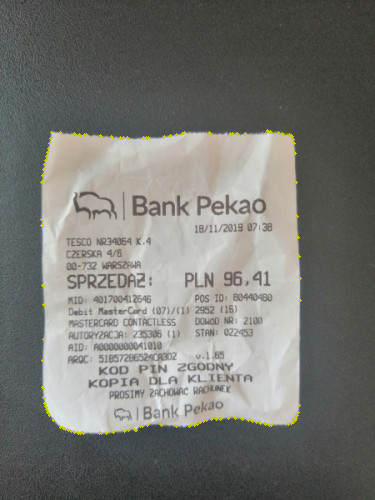

In [68]:
cnt1 = cv2.drawContours(image=image.copy(), contours = contours[0], contourIdx = -1, color = (0,200,200), thickness = 2)
cv2_imshow(cnt1)

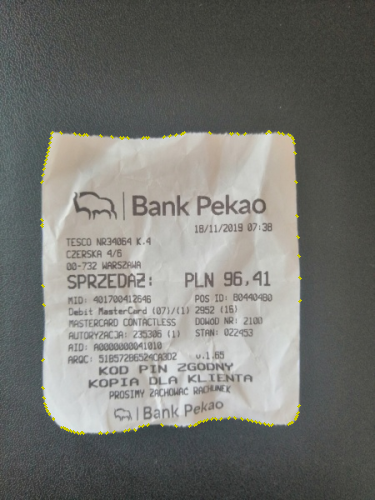

In [69]:
cnt2 = cv2.drawContours(image=image.copy(), contours = contours[1], contourIdx = -1, color = (0,200,200), thickness = 2)
cv2_imshow(cnt2)

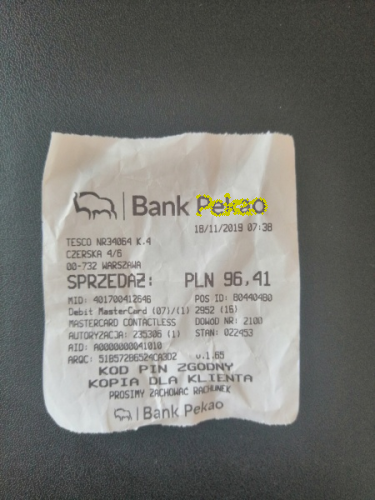

In [70]:
cnt2 = cv2.drawContours(image=image.copy(), contours = contours[2], contourIdx = -1, color = (0,200,200), thickness = 2)
cv2_imshow(cnt2)

In [71]:
for contour in contours:
    perimeter = cv2.arcLength(curve=contour, closed=True)
    approx = cv2.approxPolyDP(curve=contour, epsilon=0.02*perimeter, closed=True)

    if len(approx) == 4:
        screen_contour = approx
        break

print(screen_contour)

[[[291 135]]

 [[ 51 132]]

 [[ 60 427]]

 [[295 420]]]


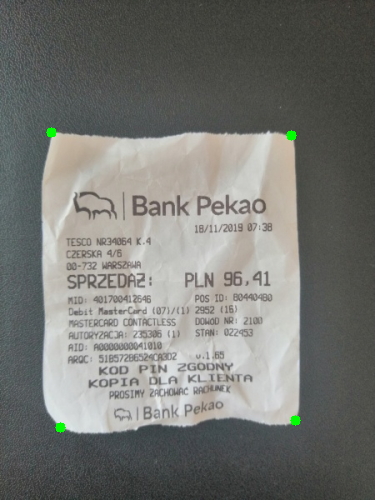

In [72]:
cv2.drawContours(image, contours=screen_contour, contourIdx=-1, color=(0,255,0), thickness=10)
cv2_imshow(image)

In [73]:
points = screen_contour.reshape(4,2)
points = points*ratio
points

array([[349.2, 162. ],
       [ 61.2, 158.4],
       [ 72. , 512.4],
       [354. , 504. ]])

In [74]:
rectangle = np.zeros((4,2), dtype='float32')
rectangle

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.]], dtype=float32)

In [75]:
total = points.sum(axis=1)

rectangle[2] = points[np.argmax(total)]
rectangle[0] = points[np.argmin(total)]
rectangle

array([[ 61.2, 158.4],
       [  0. ,   0. ],
       [354. , 504. ],
       [  0. ,   0. ]], dtype=float32)

In [76]:
difference = np.diff(points, axis=1)
rectangle[1] = points[np.argmin(difference)]
rectangle[3] = points[np.argmax(difference)]
rectangle

array([[ 61.2, 158.4],
       [349.2, 162. ],
       [354. , 504. ],
       [ 72. , 512.4]], dtype=float32)

In [77]:
(a, b, c, d) = rectangle
width1 = norm(c-d)
width2 = norm(b-a)
max_width = max(int(width1), int(width2))
height1 = norm(b-c)
height2 = norm(a - d)
max_height = max(int(height1), int(height2))

print(max_width)
print(max_height)

288
354


In [79]:
vertices = np.array([
                     [0,0],
                     [max_width-1,0],
                     [max_width-1, max_height-1],
                     [0, max_height-1]
], dtype = 'float32')

vertices

array([[  0.,   0.],
       [287.,   0.],
       [287., 353.],
       [  0., 353.]], dtype=float32)

In [80]:
M = cv2.getPerspectiveTransform(rectangle, vertices)
M

array([[ 9.47714238e-01, -2.89133112e-02, -5.34202438e+01],
       [-1.20274799e-02,  9.62196799e-01, -1.51675885e+02],
       [-1.16837073e-04, -5.27577240e-05,  1.00000000e+00]])

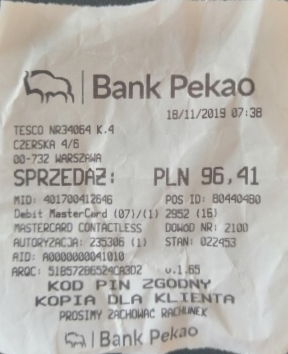

In [81]:
out = cv2.warpPerspective(src=original_image, M=M, dsize=(max_width, max_height))
cv2_imshow(out)

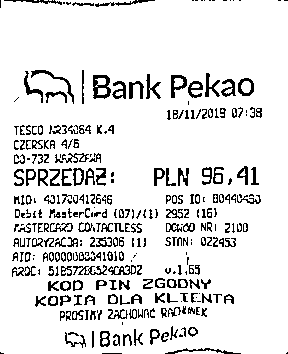

In [82]:
out = cv2.cvtColor(out, cv2.COLOR_BGR2GRAY)

T = threshold_local(image=out, block_size=11, offset=10, method='gaussian')
out = (out > T).astype('uint8')*255
cv2_imshow(out)